## Data Download
We attempt to use 1 minute data from FXCM for GBP and AUD. We are able to use approximately 1 year worth of data for our model 

In [1]:
import importlib
import datetime as dt
import numpy as np
import pandas as pd
from fxcmpy import fxcmpy_tick_data_reader as tdr
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import talib as ta
from talib import RSI, BBANDS
import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

Install Tensorflow 2.0 and above so that Keras is included. For our case, we had to create a seperate environment tensorflow_tf and use the Anaconda GUI to install TF 2.0 and Keras. Jupyter Notebook was launched in the tensorflow_tf envronment using the Anaconda gui as well.  Thereafter we had to reinstall some of our libraies used here in the new environment (via anaconda prompt). 

In [2]:
import tensorflow as tf
from tensorflow import keras

In [3]:
url = 'https://candledata.fxcorporate.com/'##This is the base url
periodicity='m1' ##periodicity, can be m1, H1, D1
url_suffix = '.csv.gz' ##Extension of the file name
symbol = 'GBPUSD' ##symbol we want to get tick data for
##Available Currencies 
##AUDCAD,AUDCHF,AUDJPY, AUDNZD,CADCHF,EURAUD,EURCHF,EURGBP
##EURJPY,EURUSD,GBPCHF,GBPJPY,GBPNZD,GBPUSD,GBPCHF,GBPJPY
##GBPNZD,NZDCAD,NZDCHF.NZDJPY,NZDUSD,USDCAD,USDCHF,USDJPY


##The candle files are stored in compressed csv.  The storage structure comes as {periodicity}/{symbol}/{year}/{week_of_year}.csv.gz
##The first week of the year will be 1.csv.gz where the 
##last week might be 52 or 53.  That will depend on the year.
##Once we have the week of the year we will be able to pull the correct file with the data that is needed.
start_dt =  dt.date(2020,1,7)##random start date
end_dt = dt.date(2020,12,31)##random end date


start_wk = start_dt.isocalendar()[1]##find the week of the year for the start  
end_wk = end_dt.isocalendar()[1] ##find the week of the year for the end 
year = str(start_dt.isocalendar()[0]) ##pull out the year of the start

###The URL is a combination of the currency, periodicity,  year, and week of the year.
###Example URL https://candledata.fxcorporate.com/m1/EURUSD/2017/29.csv.gz
###The example URL should be the first URL of this example
data=pd.DataFrame()
##This will loop through the weeks needed, create the correct URL and print out the lenght of the file.
for i in range(start_wk, end_wk ):
    url_data = url + periodicity + '/' + symbol + '/' + year + '/' + str(i) + url_suffix
    print(url_data)
    tempdata = pd.read_csv(url_data, compression='gzip')
    data =pd.concat([data, tempdata])

print(data)


https://candledata.fxcorporate.com/m1/GBPUSD/2020/2.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/3.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/4.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/5.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/6.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/7.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/8.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/9.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/10.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/11.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/12.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/13.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/14.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/15.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/16.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/2020/17.csv.gz
https://candledata.fxcorporate.com/m1/GBPUSD/202

In [4]:
gbp_df = data
gbp_df

,DateTime,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose
0,01/05/2020 22:03:00.000,1.30835,1.30849,1.30776,1.30849,1.30889,1.30926,1.30879,1.30879
1,01/05/2020 22:04:00.000,1.30849,1.30849,1.30845,1.30845,1.30879,1.30879,1.30875,1.30875
2,01/05/2020 22:05:00.000,1.30845,1.30845,1.30790,1.30790,1.30875,1.30875,1.30820,1.30820
3,01/05/2020 22:06:00.000,1.30790,1.30791,1.30775,1.30776,1.30820,1.30820,1.30805,1.30806
4,01/05/2020 22:07:00.000,1.30776,1.30791,1.30766,1.30766,1.30806,1.30821,1.30803,1.30818
...,...,...,...,...,...,...,...,...,...
5551,12/24/2020 18:59:00.000,1.35322,1.35338,1.35322,1.35334,1.35359,1.35377,1.35355,1.35361
5552,12/24/2020 19:00:00.000,1.35334,1.35334,1.35326,1.35331,1.35361,1.35370,1.35357,1.35363
5553,12/24/2020 19:01:00.000,1.35331,1.35335,1.35326,1.35335,1.35363,1.35373,1.35358,1.35360
5554,12/24/2020 19:02:00.000,1.35335,1.35335,1.35317,1.35317,1.35360,1.35363,1.35357,1.35363


In [5]:
url = 'https://candledata.fxcorporate.com/'##This is the base url
periodicity='m1' ##periodicity, can be m1, H1, D1
url_suffix = '.csv.gz' ##Extension of the file name
symbol = 'AUDUSD' ##symbol we want to get tick data for
##Available Currencies 
##AUDCAD,AUDCHF,AUDJPY, AUDNZD,CADCHF,EURAUD,EURCHF,EURGBP
##EURJPY,EURUSD,GBPCHF,GBPJPY,GBPNZD,GBPUSD,GBPCHF,GBPJPY
##GBPNZD,NZDCAD,NZDCHF.NZDJPY,NZDUSD,USDCAD,USDCHF,USDJPY


##The candle files are stored in compressed csv.  The storage structure comes as {periodicity}/{symbol}/{year}/{week_of_year}.csv.gz
##The first week of the year will be 1.csv.gz where the 
##last week might be 52 or 53.  That will depend on the year.
##Once we have the week of the year we will be able to pull the correct file with the data that is needed.
start_dt =  dt.date(2020,1,7)##random start date
end_dt = dt.date(2020,12,31)##random end date


start_wk = start_dt.isocalendar()[1]##find the week of the year for the start  
end_wk = end_dt.isocalendar()[1] ##find the week of the year for the end 
year = str(start_dt.isocalendar()[0]) ##pull out the year of the start

###The URL is a combination of the currency, periodicity,  year, and week of the year.
###Example URL https://candledata.fxcorporate.com/m1/EURUSD/2017/29.csv.gz
###The example URL should be the first URL of this example
data1=pd.DataFrame()
##This will loop through the weeks needed, create the correct URL and print out the lenght of the file.
for i in range(start_wk, end_wk ):
    url_data = url + periodicity + '/' + symbol + '/' + year + '/' + str(i) + url_suffix
    print(url_data)
    tempdata = pd.read_csv(url_data, compression='gzip')
    data1 =pd.concat([data1, tempdata])
print(data1)

https://candledata.fxcorporate.com/m1/AUDUSD/2020/2.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/3.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/4.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/5.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/6.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/7.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/8.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/9.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/10.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/11.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/12.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/13.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/14.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/15.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/16.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/2020/17.csv.gz
https://candledata.fxcorporate.com/m1/AUDUSD/202

In [6]:
aud_df = data1
aud_df

,DateTime,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose
0,01/05/2020 22:00:00.000,0.69410,0.69410,0.69410,0.69410,0.69431,0.69431,0.69430,0.69430
1,01/05/2020 22:02:00.000,0.69410,0.69410,0.69386,0.69410,0.69430,0.69454,0.69430,0.69431
2,01/05/2020 22:03:00.000,0.69410,0.69420,0.69386,0.69412,0.69431,0.69454,0.69413,0.69422
3,01/05/2020 22:04:00.000,0.69412,0.69417,0.69411,0.69413,0.69422,0.69435,0.69422,0.69428
4,01/05/2020 22:05:00.000,0.69413,0.69415,0.69402,0.69403,0.69428,0.69435,0.69414,0.69428
...,...,...,...,...,...,...,...,...,...
5554,12/24/2020 18:59:00.000,0.75925,0.75930,0.75925,0.75930,0.75945,0.75945,0.75944,0.75944
5555,12/24/2020 19:00:00.000,0.75930,0.75932,0.75930,0.75932,0.75944,0.75957,0.75944,0.75952
5556,12/24/2020 19:01:00.000,0.75932,0.75935,0.75932,0.75935,0.75952,0.75958,0.75950,0.75952
5557,12/24/2020 19:02:00.000,0.75935,0.75935,0.75930,0.75932,0.75952,0.75958,0.75951,0.75951


In [7]:
gbp_df.to_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/GBPUSD_1min.csv')

In [8]:
aud_df.to_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/AUDUSD_1min.csv')

In [9]:
gbp = pd.read_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/GBPUSD_1min.csv')
aud = pd.read_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/AUDUSD_1min.csv')

# What is ...... 


### Simple Moving Average

A simple moving average (SMA) calculates the average of a range of closing prices, by the number of periods in that range.
It can be used to determine if an asset price will continue or if it will reverse a bull or bear trend.

### RSI
The relative strength index (RSI) is a momentum indicator used in technical analysis that measures the magnitude of recent price changes. The RSI is displayed as an oscillator, uses 14 periods in calculation and can have a reading from 0 to 100. It signals overnought or oversold price momentum.An asset is usually considered overbought when the RSI is above 70% and oversold when it is below 30%.

### Slow Stochastic 

The Slow Stochastic Oscillator is a momentum indicator that shows the location of the close relative to the high-low range over a set number of periods. The indicator can range from 0 to 100.
Two lines are considered, the slow oscillating %K and a moving average of %K, commonly referred to as %D.
On a chart, the area above 80 indicates an overbought region, while the area below 20 is considered an oversold region. 
A crossover signal occurs when the two lines cross in the overbought or oversold region. A sell signal occurs when a decreasing %K line crosses below the %D line in the overbought region. Conversely, a buy signal occurs when an increasing %K line crosses above the %D line in the oversold region.

### MACD
MACD is the 12-day Exponential Moving Average (EMA) less the 26-day EMA. Closing prices are used to form the MACD's moving averages. A 9-day EMA of MACD is plotted along side to act as a signal line to identify turns in the indicator. The MACD-Histogram represents the difference between MACD and its 9-day EMA, the signal line. 
A sell signal occurs when the MACD cuts down below the MACD Signal Line and vice versa.
In our analysis, we prefer to use MACD with a customised  EMA period, namely 5, 8 and 21.


# Data Cleaning

In [10]:
currencies = [gbp,aud]

for i in currencies:
    i.rename(columns = {'DateTime':'Date'}, inplace = True)
    i['Open'] = (i['BidOpen'] + i['AskOpen'])/2
    i['Close'] = (i['BidClose'] + i['AskClose'])/2
    i['High'] = (i['BidHigh'] + i['AskHigh'])/2
    i['Low'] = (i['BidLow'] + i['AskLow'])/2
    i['SMA20'] = ta.SMA(i['Close'],20)
    i['SMA50'] = ta.SMA(i['Close'],50)
    i['SMA100'] = ta.SMA(i['Close'],100)
    i['Price_Gap'] = i['Close'].pct_change()
    i['RSI'] = ta.RSI(i['Close'],14)
    i['Stoch_slowk'], i['Stoch_slowd'] = ta.STOCH(i['High'], i['Low'], i['Close'], fastk_period=14, slowk_period=3, slowk_matype=0, slowd_period=3, slowd_matype=0)
    i["MACD"], i["MACD_signal_line"], i["MACD_hist"] = ta.MACD(i['Close'], fastperiod=8, slowperiod=21, signalperiod=5)
    print("done")
   
    


done
done


In [11]:
gbp = gbp.drop({'Unnamed: 0','BidOpen','BidHigh','BidLow','BidClose','AskOpen','AskHigh','AskLow','AskClose'}, axis=1)
 

In [12]:
aud = aud.drop({'Unnamed: 0','BidOpen','BidHigh','BidLow','BidClose','AskOpen','AskHigh','AskLow','AskClose'}, axis=1)

In [13]:
gbp.head(10)

,Date,Open,Close,High,Low,SMA20,SMA50,SMA100,Price_Gap,RSI,Stoch_slowk,Stoch_slowd,MACD,MACD_signal_line,MACD_hist
0,01/05/2020 22:03:00.000,1.30862,1.308640,1.308875,1.308275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01/05/2020 22:04:00.000,1.30864,1.308600,1.308640,1.308600,NaN,NaN,NaN,-0.000031,NaN,NaN,NaN,NaN,NaN,NaN
2,01/05/2020 22:05:00.000,1.30860,1.308050,1.308600,1.308050,NaN,NaN,NaN,-0.000420,NaN,NaN,NaN,NaN,NaN,NaN
3,01/05/2020 22:06:00.000,1.30805,1.307910,1.308055,1.307900,NaN,NaN,NaN,-0.000107,NaN,NaN,NaN,NaN,NaN,NaN
4,01/05/2020 22:07:00.000,1.30791,1.307920,1.308060,1.307845,NaN,NaN,NaN,0.000008,NaN,NaN,NaN,NaN,NaN,NaN
5,01/05/2020 22:08:00.000,1.30792,1.307940,1.307940,1.307910,NaN,NaN,NaN,0.000015,NaN,NaN,NaN,NaN,NaN,NaN
6,01/05/2020 22:09:00.000,1.30794,1.307940,1.307940,1.307880,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
7,01/05/2020 22:10:00.000,1.30794,1.307710,1.307940,1.307710,NaN,NaN,NaN,-0.000176,NaN,NaN,NaN,NaN,NaN,NaN
8,01/05/2020 22:11:00.000,1.30771,1.306830,1.307765,1.306810,NaN,NaN,NaN,-0.000673,NaN,NaN,NaN,NaN,NaN,NaN
9,01/05/2020 22:12:00.000,1.30683,1.306825,1.306845,1.306815,NaN,NaN,NaN,-0.000004,NaN,NaN,NaN,NaN,NaN,NaN


# Strategies

This part took me a lot of time because I want to pick what really works in my experience and not treat this as a purely academic exercise.
There are a multitude of strategies used by traders and it is really hard to pinpoint which is the best, as different strategies work well for different aseet classes/pair, with time frame also as an important factor. 

Here, we try to pick out some of the more common strategies used, including last close,  MA crossover, RSI, Stochastic Slow and MACD crossover. These strategies can be classed into moving average and momentum strategies, and we would like to test which one or a combination of which performs better.

Another factor to consider is the periods chosen for the technical indicators. I have chosen my favourite here but one can always test different permutations which is beyond the scope of this project.

# Talk abt periods chosen and strategy ******

### Implementing a RSI signal to be used later

The code below attempts to find where the RSI line starts to rise or fall in the next period, using 50 handle as the pivot line. While most textbooks tell us that a RSI of 30 means the pair has been oversold and a RSI of 70 denotes that the pair has been overbought, in reality, RSI can stay in these regions for a long while. We prefer to execute a buy trade when RSI is below 50 but is rising up and a sell trade when RSI is above the 50 handle and turning down. 

Labels: 0 -Sell, 1 -Hold, 2-Buy


In [16]:
for i in range(len(gbp['RSI'])-1):
    if gbp['RSI'][i] <= 50:
        if gbp['RSI'][i+1] > gbp['RSI'][i]:
            gbp['RSI_signal'][i+1]= 2
        else:
            gbp['RSI_signal'][i+1] = 1
    elif gbp['RSI'][i] > 50:
        if gbp['RSI'][i+1] < gbp['RSI'][i]:
            gbp['RSI_signal'][i+1] = 0
        else:
            gbp['RSI_signal'][i+1] = 1
        

C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [18]:
for i in range(len(aud['RSI'])-1):
    if aud['RSI'][i] <= 50:
        if aud['RSI'][i+1] > aud['RSI'][i]:
            aud['RSI_signal'][i+1] = 2
        else:
            aud['RSI_signal'][i+1] = 1
    elif aud['RSI'][i] > 50:
        if aud['RSI'][i+1] < aud['RSI'][i]:
            aud['RSI_signal'][i+1] = 0
        else:
            aud['RSI_signal'][i+1] = 1

C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

### Implementing a macd crossover signal to be used later

The code below attempts to find where the MACD line crosses the MACD signal line. If the statements that MACD signal line lies below the MACD line is not equivalent for the i and i+1 row, this means that an intersection ocurred. Once the intersection has occured we want to find rows where the MACD cut above the signal line (ie line 3 below). We assign a label of 1.0 (BUY signal) for these cases, a label of 2.0(SELL) for cases where the MACD line cuts down below the MACD signal line and a label of 0 otherwise. 



In [20]:
for i in range(len(gbp['MACD_signal_line'])-1):
    if (gbp['MACD_signal_line'][i+1] < gbp['MACD'][i+1]) != (gbp['MACD_signal_line'][i] < gbp['MACD'][i]):
        if ((gbp['MACD_signal_line'][i+1] < gbp['MACD'][i+1]),(gbp['MACD_signal_line'][i] < gbp['MACD'][i])) == (True,False):
               gbp['macd_signal'][i+1] = 2
        else:
               gbp['macd_signal'][i+1] = 0
    else:
         gbp['macd_signal'][i+1] = 1



C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [22]:
for i in range(len(aud['MACD_signal_line'])-1):
    if (aud['MACD_signal_line'][i+1] < aud['MACD'][i+1]) != (aud['MACD_signal_line'][i] < aud['MACD'][i]):
        if ((aud['MACD_signal_line'][i+1] < aud['MACD'][i+1]),(aud['MACD_signal_line'][i] < aud['MACD'][i])) == (True,False):
               aud['macd_signal'][i+2] = 2
        else:
               aud['macd_signal'][i+2] = 0
    else:
         aud['macd_signal'][i+2] = 1


C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\STELLA\anaconda3\envs\tensorflow_tf\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [23]:
gbp.to_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/GBPUSD_RSI_MACD.csv')
aud.to_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/AUDUSD_RSI_MACD.csv')

## Summary of our strategies

### Strategy 1 - Previous Close

A buy signal is generated if today's clsoe is greater than previous period's close.

The steps are:

a) Assign a signal of 1.0 for buy and 0.0 otherwise

b) Position is the difference in signals in a) and can take values of 0, 1 and -1 (intuitively 0-hold, 1-buy, -1-sell)

c) For use in LSTM later, we reassign labels as: 0-Sell, 1-Hold, 2-Buy. 

In [24]:
#Strategy 1 Closing
gbp['Prev'] = gbp['Close'].shift(periods=1)
gbp['Signal_Prev'] = np.where(gbp['Close'] > gbp['Prev'], 1, 0)
gbp['Position_Prev'] =  gbp['Signal_Prev'].diff() 
gbp['Position_Prev'] = gbp['Position_Prev'] +1

### Strategy 2 - Moving Average Strategy
2nd strategy is a moving average strategy where a buy signal is generated if SMA20 > SMA50 and the price lies above SMA100
The steps are:

a) Assign a signal of 1.0 for buy and 0.0 otherwise

b) Position is the difference in signals in a) and can take values of 0, 1 and -1 (intuitively 0-hold, 1-buy, -1-sell)

c) For use in LSTM later, we reassign labels as: 0-Sell, 1-Hold, 2-Buy. 

In [25]:
#Strategy 2 Simple Moving Average
gbp['Signal_MA'] = np.where((gbp['SMA20'] > gbp['SMA50']) & (gbp['Close']>gbp['SMA100']), 1, 0)
gbp['Position_MA'] =  gbp['Signal_MA'].diff() 
gbp['Position_MA'] = gbp['Position_MA'] +1

In [26]:
#Strategy 3 combine MA and RSI
gbp['Position_MA_RSI'] = np.where(gbp['Position_MA'] == gbp['RSI_signal'], gbp['RSI_signal'], 1)
                                  
#Strategy 4 combine MACD, RSI and Stochastic
gbp['Signal_Stoch'] = np.where((gbp['Stoch_slowk']<25) & (gbp['Stoch_slowk']> gbp['Stoch_slowd']), 1, 0)
gbp['Position_Stoch'] = gbp['Signal_Stoch'].diff() 
gbp['Position_Stoch']= gbp['Position_Stoch'] + 1
gbp['Position_Momentum'] = np.where((gbp['Position_Stoch'] == gbp['RSI_signal'])&
                                    (gbp['macd_signal'] == gbp['RSI_signal']), gbp['RSI_signal'],1)

In [27]:
gbp[gbp['Position_Momentum']== 2]

,Date,Open,Close,High,Low,SMA20,SMA50,SMA100,Price_Gap,RSI,...,macd_signal,Prev,Signal_Prev,Position_Prev,Signal_MA,Position_MA,Position_MA_RSI,Signal_Stoch,Position_Stoch,Position_Momentum
471,01/06/2020 05:59:00.000,1.308040,1.308125,1.308125,1.308015,1.308196,1.308273,1.308359,0.000065,45.394243,...,2,1.308040,1,2.0,0,1.0,1,1,2.0,2
492,01/06/2020 06:20:00.000,1.306905,1.307245,1.307250,1.306900,1.307582,1.307972,1.308163,0.000260,36.020503,...,2,1.306905,1,2.0,0,1.0,1,1,2.0,2
1126,01/06/2020 16:54:00.000,1.315785,1.316200,1.316285,1.315675,1.316267,1.316195,1.315680,0.000315,50.123122,...,2,1.315785,1,2.0,1,1.0,1,1,2.0,2
1190,01/06/2020 17:58:00.000,1.315755,1.315935,1.316105,1.315670,1.316044,1.316559,1.316477,0.000137,41.407543,...,2,1.315755,1,1.0,0,1.0,1,1,2.0,2
1270,01/06/2020 19:18:00.000,1.315615,1.315705,1.315730,1.315605,1.315799,1.316166,1.316176,0.000068,39.695183,...,2,1.315615,1,1.0,0,1.0,1,1,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354696,12/24/2020 03:54:00.000,1.354395,1.354420,1.354460,1.354365,1.354733,1.355388,1.355411,0.000018,33.264242,...,2,1.354395,1,1.0,0,1.0,1,1,2.0,2
354722,12/24/2020 04:20:00.000,1.354405,1.354575,1.354620,1.354395,1.354822,1.354834,1.355284,0.000126,43.702595,...,2,1.354405,1,2.0,0,1.0,1,1,2.0,2
354728,12/24/2020 04:26:00.000,1.354285,1.354415,1.354430,1.354280,1.354552,1.354725,1.355220,0.000096,43.833424,...,2,1.354285,1,1.0,0,1.0,1,1,2.0,2
355131,12/24/2020 11:09:00.000,1.359680,1.359950,1.360005,1.359630,1.360545,1.361088,1.360431,0.000199,39.879076,...,2,1.359680,1,2.0,0,1.0,1,1,2.0,2


In [28]:
gbp = gbp.dropna()

In [29]:
gbp

,Date,Open,Close,High,Low,SMA20,SMA50,SMA100,Price_Gap,RSI,...,macd_signal,Prev,Signal_Prev,Position_Prev,Signal_MA,Position_MA,Position_MA_RSI,Signal_Stoch,Position_Stoch,Position_Momentum
99,01/05/2020 23:46:00.000,1.308275,1.308385,1.308395,1.308225,1.308146,1.307724,1.307556,0.000084,65.711586,...,1,1.308275,1,1.0,1,2.0,1,0,1.0,1
100,01/05/2020 23:47:00.000,1.308385,1.308365,1.308400,1.308330,1.308169,1.307735,1.307553,-0.000015,64.457885,...,1,1.308385,0,0.0,1,1.0,1,0,1.0,1
101,01/05/2020 23:48:00.000,1.308365,1.308375,1.308395,1.308340,1.308194,1.307750,1.307551,0.000008,64.819304,...,1,1.308365,1,2.0,1,1.0,1,0,1.0,1
102,01/05/2020 23:49:00.000,1.308375,1.308345,1.308400,1.308340,1.308217,1.307771,1.307554,-0.000023,62.757536,...,1,1.308375,0,0.0,1,1.0,1,0,1.0,1
103,01/05/2020 23:50:00.000,1.308345,1.308300,1.308475,1.308300,1.308233,1.307797,1.307558,-0.000034,59.690514,...,1,1.308345,0,1.0,1,1.0,1,0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355601,12/24/2020 18:59:00.000,1.353405,1.353475,1.353575,1.353385,1.353560,1.353524,1.353866,0.000052,48.199911,...,1,1.353405,1,2.0,0,1.0,1,0,1.0,1
355602,12/24/2020 19:00:00.000,1.353475,1.353470,1.353520,1.353415,1.353557,1.353519,1.353855,-0.000004,47.980381,...,1,1.353475,0,0.0,0,1.0,1,0,1.0,1
355603,12/24/2020 19:01:00.000,1.353470,1.353475,1.353540,1.353420,1.353557,1.353515,1.353843,0.000004,48.234288,...,1,1.353470,1,2.0,0,1.0,1,0,1.0,1
355604,12/24/2020 19:02:00.000,1.353475,1.353400,1.353490,1.353370,1.353552,1.353505,1.353830,-0.000055,44.709120,...,1,1.353475,0,0.0,0,1.0,1,0,1.0,1


In [30]:
#For AUD
#Strategy 1 Closing
aud['Prev'] = aud['Close'].shift(periods=1)
aud['Signal_Prev'] = np.where(aud['Close'] > aud['Prev'], 1, 0)
aud['Position_Prev'] =  aud['Signal_Prev'].diff() 
aud['Position_Prev'] = aud['Position_Prev'] +1

#Strategy 2 Simple Moving Average
aud['Signal_MA'] = np.where((aud['SMA20'] > aud['SMA50']) & (aud['Close']>aud['SMA100']), 1, 0)
aud['Position_MA'] =  aud['Signal_MA'].diff() 
aud['Position_MA'] = aud['Position_MA'] +1

#Strategy 3 combine MA and RSI
aud['Position_MA_RSI'] = np.where(aud['Position_MA'] == aud['RSI_signal'], aud['RSI_signal'], 1)
                                  
#Strategy 4 combine MACD, RSI and Stochastic
aud['Signal_Stoch'] = np.where((aud['Stoch_slowk']<25) & (aud['Stoch_slowk']> aud['Stoch_slowd']), 1, 0)
aud['Position_Stoch'] = aud['Signal_Stoch'].diff() 
aud['Position_Stoch']= aud['Position_Stoch'] + 1
aud['Position_Momentum'] = np.where((aud['Position_Stoch'] == aud['RSI_signal'])&
                                    (aud['macd_signal'] == aud['RSI_signal']), aud['RSI_signal'],1)

In [31]:
aud = aud.dropna()

# Data Visualisation

## Scatterplot of dataset and variables

Text(0.5, 1, 'AUDUSD vs SMA20')

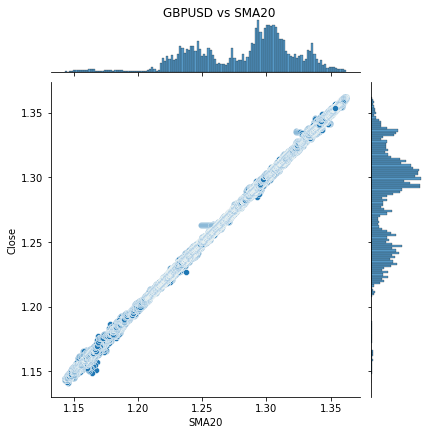

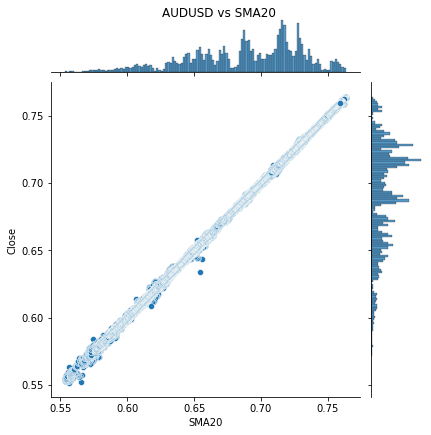

In [32]:
sns.jointplot( x = 'SMA20', y = 'Close', data = gbp).fig.suptitle("GBPUSD vs SMA20", y=1)

sns.jointplot( x = 'SMA20', y = 'Close', data = aud).fig.suptitle("AUDUSD vs SMA20", y=1)

Text(0.5, 1, 'AUDUSD vs RSI')

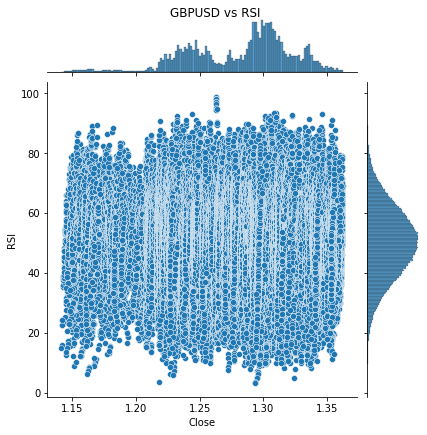

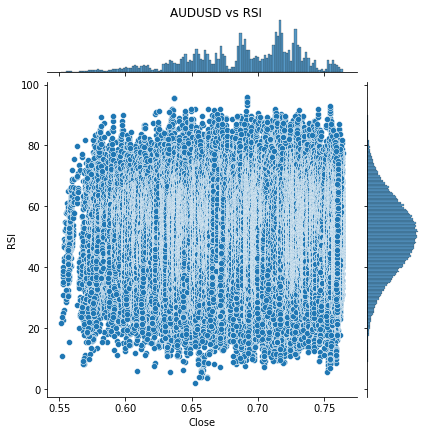

In [33]:
sns.jointplot( y = 'RSI', x = 'Close', data = gbp).fig.suptitle("GBPUSD vs RSI", y=1)

sns.jointplot( y = 'RSI', x = 'Close', data = aud).fig.suptitle("AUDUSD vs RSI", y=1)

### Lets try to visualise our strategies using a simple plot. As each currency pair has 300k rows, we will choose a subset of 300 to 500 rows to show the signals in a visible manner

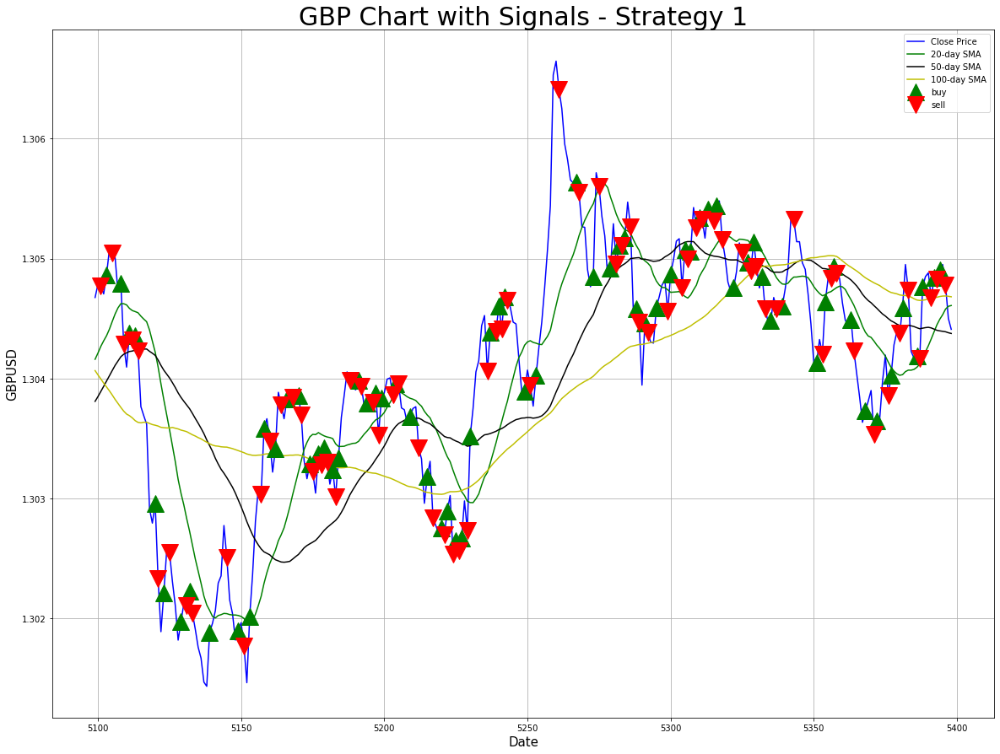

In [34]:
#Visualisation for Strategy 1
#gbp1 = gbp.loc['01/05/2020 22:03:00.000':'01/06/2020 04:03:00.000',:]

gbp1 = gbp.iloc[5000:5300, :]

plt.figure(figsize = (20,15))
# plot close price, SMA20 and SMA50
gbp1['Close'].plot(color = 'b', label= 'Close Price')
gbp1['SMA20'].plot(color = 'g',label = '20-day SMA') 
gbp1['SMA50'].plot(color = 'k', label = '50-day SMA')
gbp1['SMA100'].plot(color = 'y', label = '100-day SMA')

# plot ‘buy’ signals in green arrows
plt.plot(gbp1[gbp1['Position_Prev'] == 2].index, 
         gbp1['Close'][gbp1['Position_Prev'] == 2], 
         '^', markersize = 20, color = 'g', label = 'buy')
                          
# plot ‘sell’ signals in red arrows
plt.plot(gbp1[gbp1['Position_Prev'] == 0].index, 
         gbp1['Close'][gbp1['Position_Prev'] == 0], 
         'v', markersize = 20, color = 'r', label = 'sell')


plt.ylabel('GBPUSD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('GBP Chart with Signals - Strategy 1', fontsize = 30)
plt.legend()
plt.grid()
plt.show()

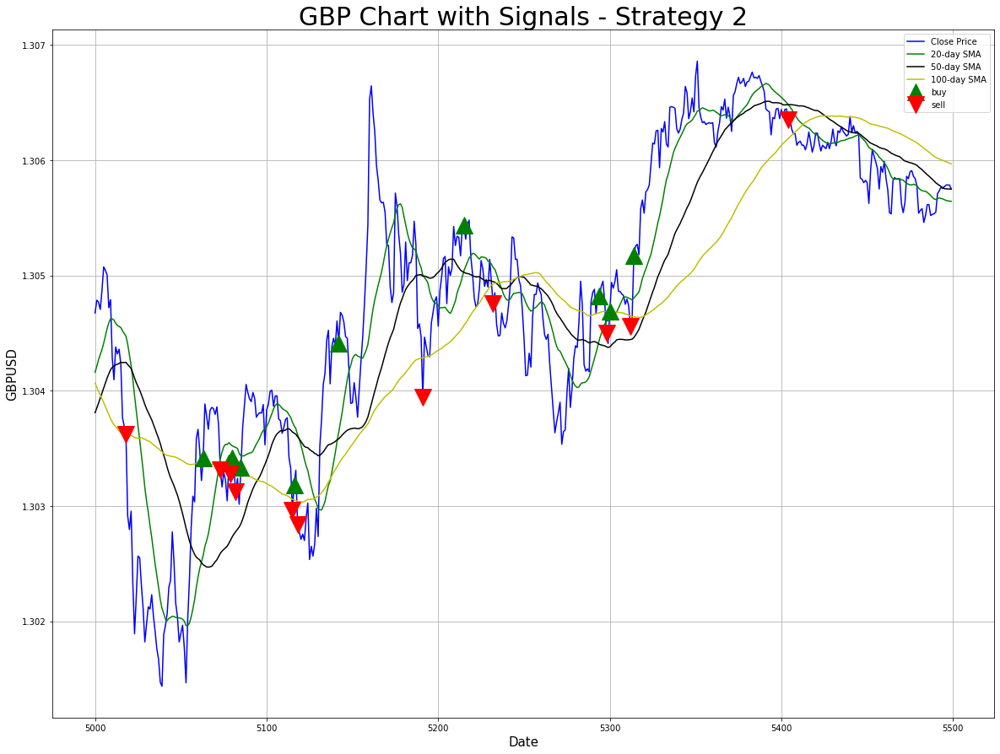

In [35]:
#Visualisation for Strategy 2
gbp1 = gbp.reset_index().iloc[5000:5500, :]

plt.figure(figsize = (20,15))
# plot close price, SMA20 and SMA50
gbp1['Close'].plot(color = 'b', label= 'Close Price')
gbp1['SMA20'].plot(color = 'g',label = '20-day SMA') 
gbp1['SMA50'].plot(color = 'k', label = '50-day SMA')
gbp1['SMA100'].plot(color = 'y', label = '100-day SMA')

# plot ‘buy’ signals in green arrows
plt.plot(gbp1[gbp1['Position_MA'] == 2].index, 
         gbp1['Close'][gbp1['Position_MA'] == 2], 
         '^', markersize = 20, color = 'g', label = 'buy')
                          
# plot ‘sell’ signals in red arrows
plt.plot(gbp1[gbp1['Position_MA'] == 0].index, 
         gbp1['Close'][gbp1['Position_MA'] == 0], 
         'v', markersize = 20, color = 'r', label = 'sell')


plt.ylabel('GBPUSD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('GBP Chart with Signals - Strategy 2', fontsize = 30)
plt.legend()
plt.grid()
plt.show()


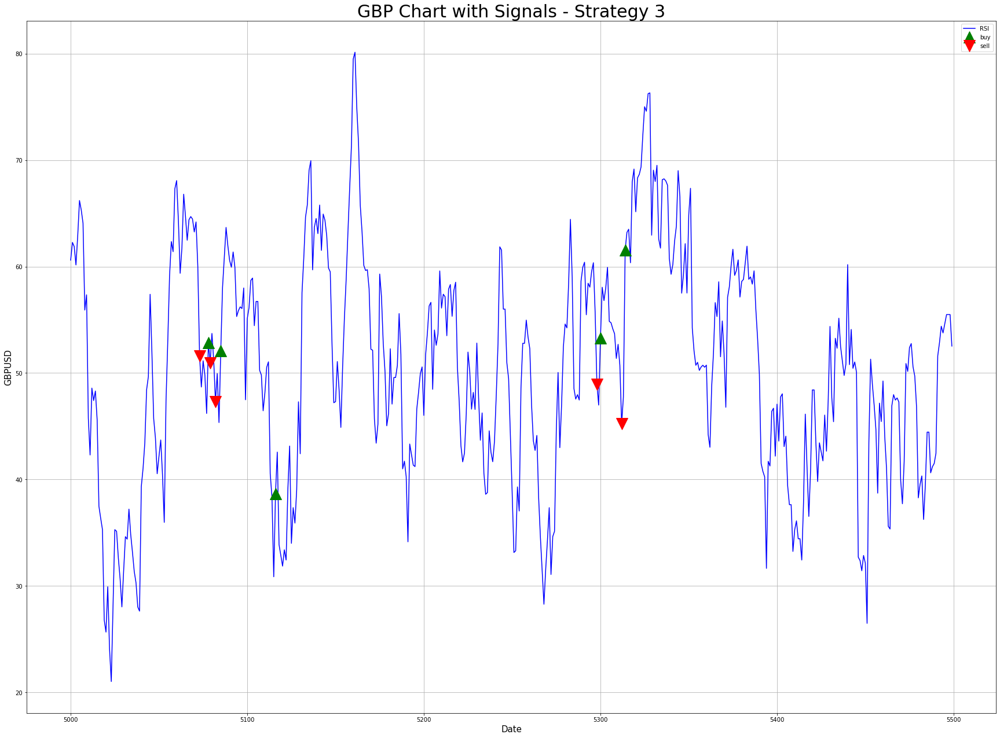

In [36]:
#Visualisation for Strategy 3
gbp1 = gbp.reset_index().iloc[5000:5500, :]
plt.figure(figsize = (30,22))
gbp1['RSI'].plot(color = 'b', label = 'RSI')


# plot ‘buy’ signals in green arrows
plt.plot(gbp1[gbp1['Position_MA_RSI'] == 2].index, 
         gbp1['RSI'][gbp1['Position_MA_RSI'] == 2], 
         '^', markersize = 20, color = 'g', label = 'buy')
                          
# plot ‘sell’ signals in red arrows
plt.plot(gbp1[gbp1['Position_MA_RSI'] == 0].index, 
         gbp1['RSI'][gbp1['Position_MA_RSI'] == 0], 
         'v', markersize = 20, color = 'r', label = 'sell')

plt.ylabel('GBPUSD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('GBP Chart with Signals - Strategy 3', fontsize = 30)
plt.legend()
plt.grid()
plt.show()


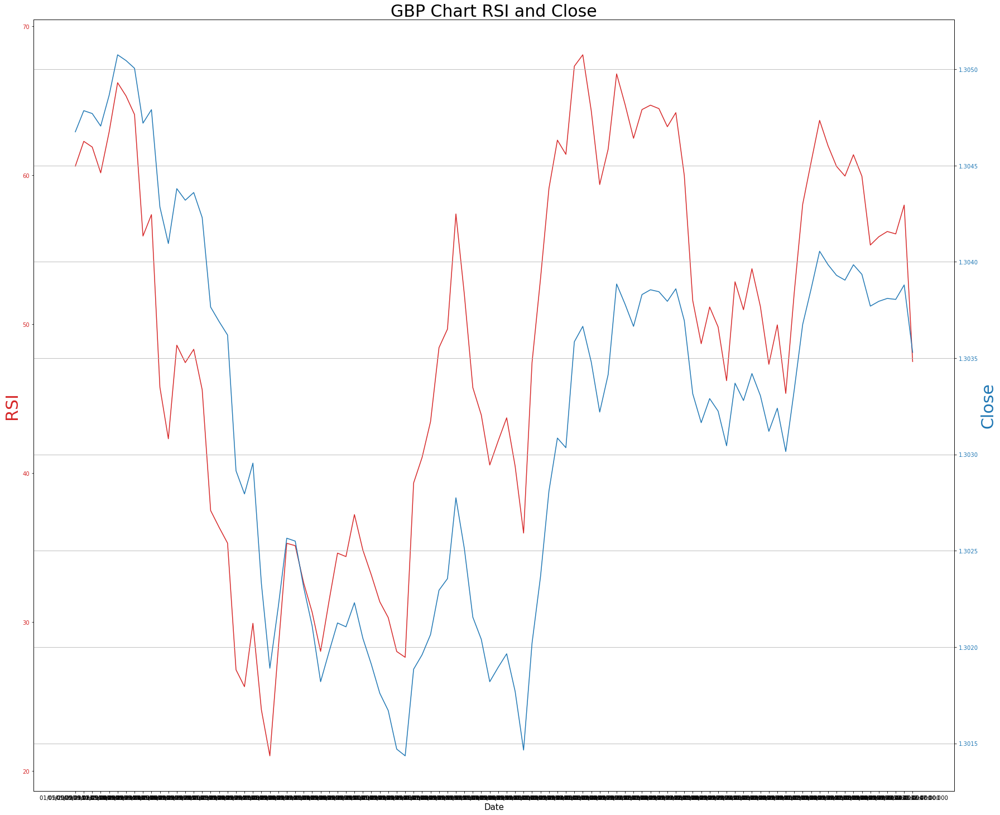

In [37]:
#Plot RSI and close in a chart
gbp1 = gbp.reset_index().iloc[5000:5100, :]

fig, ax1 = plt.subplots(figsize = (25,20))

color = 'tab:red'
ax1.set_xlabel('Date', fontsize=15)
ax1.set_ylabel('RSI', color=color, fontsize=30)
ax1.plot(gbp1['Date'], gbp1['RSI'],label='RSI',color = color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Close', color=color, fontsize=30)  # we already handled the x-label with ax1
ax2.plot(gbp1['Date'], gbp1['Close'], label='Close', color = color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped

plt.title('GBP Chart RSI and Close', fontsize = 30)
plt.grid()
plt.show()

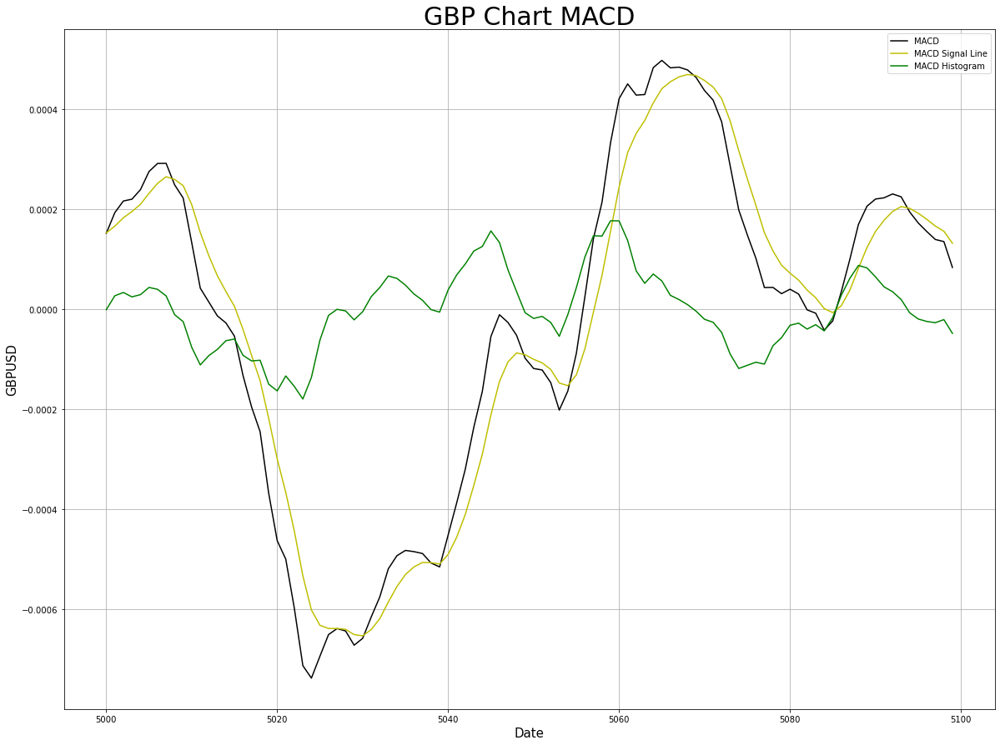

In [38]:
#Visualisation for Strategy 4
gbp1 = gbp.reset_index().iloc[5000:5100, :]

plt.figure(figsize = (20,15))
gbp1['MACD'].plot(color = 'k', label = 'MACD')
gbp1['MACD_signal_line'].plot(color = 'y', label = 'MACD Signal Line')
gbp1['MACD_hist'].plot(color = 'g', label = 'MACD Histogram')
plt.ylabel('GBPUSD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('GBP Chart MACD', fontsize = 30)
plt.legend()
plt.grid()
plt.show()



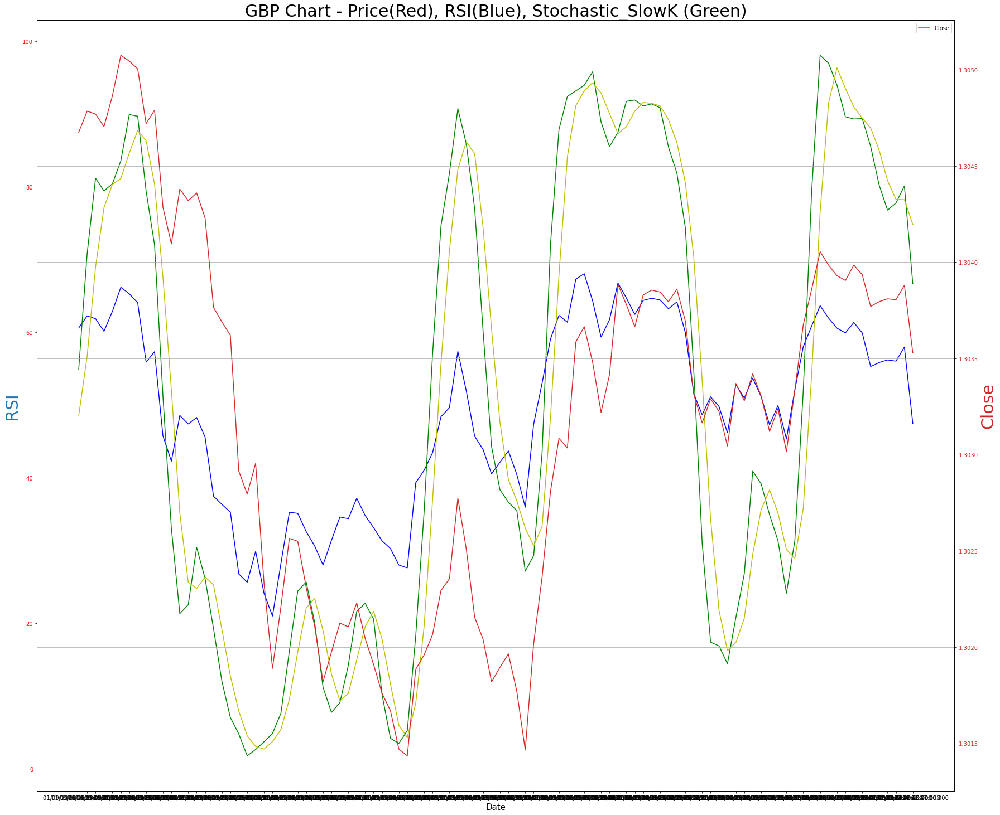

In [39]:
#Plot RSI, St0chastic and Close on a chart 

fig, ax1 = plt.subplots(figsize = (25,20))

ax1.set_xlabel('Date', fontsize=15)
ax1.set_ylabel('RSI', color=color, fontsize=30)
ax1.plot(gbp1['Date'], gbp1['RSI'],label ='RSI',color = 'b')
ax1.plot(gbp1['Date'], gbp1['Stoch_slowk'], label ='Stoch_SlowK', color = 'g')
ax1.plot(gbp1['Date'], gbp1['Stoch_slowd'], label ='Stoch_SlowD', color = 'y')
ax1.tick_params(axis='y', labelcolor='r')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:red'
ax2.set_ylabel('Close', color=color, fontsize=30)  # we already handled the x-label with ax1
red_line = ax2.plot(gbp1['Date'], gbp1['Close'], label='Close', color = color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped

plt.title('GBP Chart - Price(Red), RSI(Blue), Stochastic_SlowK (Green)', fontsize = 30)
plt.legend()
plt.grid()
plt.show()



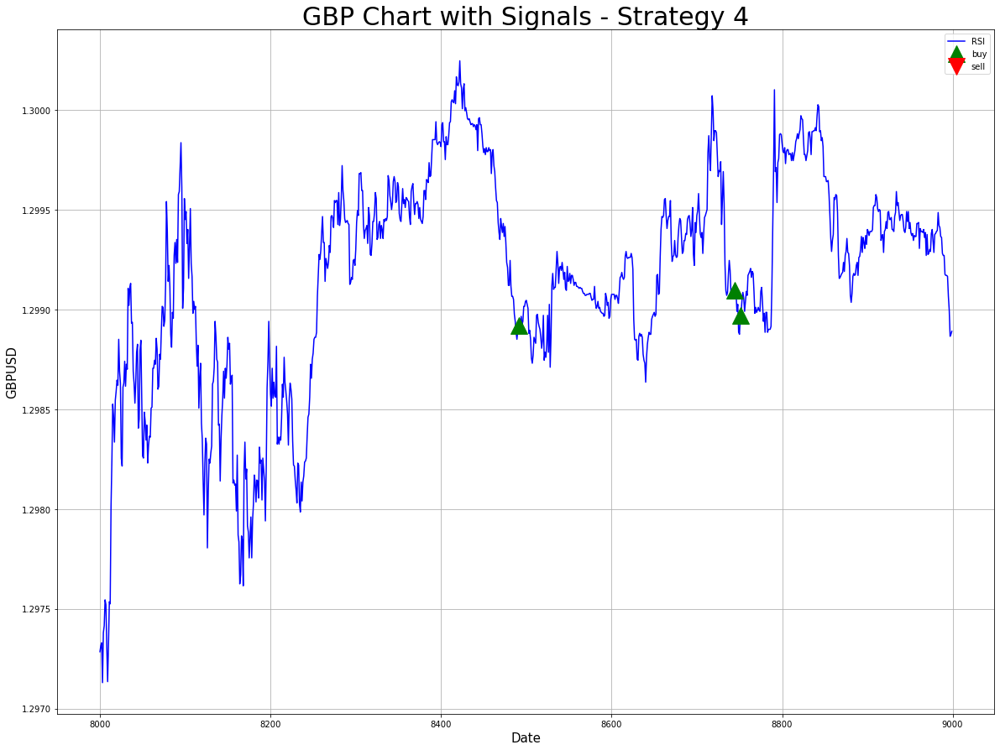

In [40]:
gbp1 = gbp.reset_index().iloc[8000:9000, :]
plt.figure(figsize = (20,15))
gbp1['Close'].plot(color = 'b', label = 'RSI')

# plot ‘buy’ signals in green arrows
plt.plot(gbp1[gbp1['Position_Momentum'] == 2].index, 
         gbp1['Close'][gbp1['Position_Momentum'] == 2], 
         '^', markersize = 20, color = 'g', label = 'buy')
                          
# plot ‘sell’ signals in red arrows
plt.plot(gbp1[gbp1['Position_Momentum'] == 0].index, 
         gbp1['Close'][gbp1['Position_Momentum'] == 0], 
         'v', markersize = 20, color = 'r', label = 'sell')


plt.ylabel('GBPUSD', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('GBP Chart with Signals - Strategy 4', fontsize = 30)
plt.legend()
plt.grid()
plt.show()

# Neural Networks

Neural Networks are a set of algorithms which closely resemble the human brain and are designed to recognize patterns. 

Recurrent Neural Network is a generalization of feedforward neural network that has an internal memory. RNN is recurrent in nature as it performs the same function for every input of data while the output of the current input depends on the past one computation. After producing the output, it is copied and sent back into the recurrent network. For making a decision, it considers the current input and the output that it has learned from the previous input.In other neural networks, all the inputs are independent of each other. But in RNN, all the inputs are related to each other.

This makes RNN useful for predicting forex prices. Long Short-Term Memory (LSTM) networks are a modified version of recurrent neural networks, which makes it easier to remember past data in memory. The vanishing gradient problem of RNN is resolved here. 

LSTMs can be used to model univariate and multivariate time series forecasting problems.
We will focus on univariate model here - these comprise of a  single series of observations and a model is required to learn from the series of past observations to predict the next value in the sequence.

Before we can develop the LSTM, we have to make a few imports from Keras: Sequential for initializing the neural network, LSTM to add the LSTM layer, Dropout for preventing overfitting with dropout layers, and Dense to add a densely connected neural network layer.

In [46]:
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense

In [47]:
gbp

,Date,Open,Close,High,Low,SMA20,SMA50,SMA100,Price_Gap,RSI,...,macd_signal,Prev,Signal_Prev,Position_Prev,Signal_MA,Position_MA,Position_MA_RSI,Signal_Stoch,Position_Stoch,Position_Momentum
99,01/05/2020 23:46:00.000,1.308275,1.308385,1.308395,1.308225,1.308146,1.307724,1.307556,0.000084,65.711586,...,1,1.308275,1,1.0,1,2.0,1,0,1.0,1
100,01/05/2020 23:47:00.000,1.308385,1.308365,1.308400,1.308330,1.308169,1.307735,1.307553,-0.000015,64.457885,...,1,1.308385,0,0.0,1,1.0,1,0,1.0,1
101,01/05/2020 23:48:00.000,1.308365,1.308375,1.308395,1.308340,1.308194,1.307750,1.307551,0.000008,64.819304,...,1,1.308365,1,2.0,1,1.0,1,0,1.0,1
102,01/05/2020 23:49:00.000,1.308375,1.308345,1.308400,1.308340,1.308217,1.307771,1.307554,-0.000023,62.757536,...,1,1.308375,0,0.0,1,1.0,1,0,1.0,1
103,01/05/2020 23:50:00.000,1.308345,1.308300,1.308475,1.308300,1.308233,1.307797,1.307558,-0.000034,59.690514,...,1,1.308345,0,1.0,1,1.0,1,0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355601,12/24/2020 18:59:00.000,1.353405,1.353475,1.353575,1.353385,1.353560,1.353524,1.353866,0.000052,48.199911,...,1,1.353405,1,2.0,0,1.0,1,0,1.0,1
355602,12/24/2020 19:00:00.000,1.353475,1.353470,1.353520,1.353415,1.353557,1.353519,1.353855,-0.000004,47.980381,...,1,1.353475,0,0.0,0,1.0,1,0,1.0,1
355603,12/24/2020 19:01:00.000,1.353470,1.353475,1.353540,1.353420,1.353557,1.353515,1.353843,0.000004,48.234288,...,1,1.353470,1,2.0,0,1.0,1,0,1.0,1
355604,12/24/2020 19:02:00.000,1.353475,1.353400,1.353490,1.353370,1.353552,1.353505,1.353830,-0.000055,44.709120,...,1,1.353475,0,0.0,0,1.0,1,0,1.0,1


In [48]:
## saves DF to csv format so that if code has error, we can run it from here

gbp.to_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/GBPUSD_NN.csv')
aud.to_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/AUDUSD_NN.csv')

# STRATEGY 1 - Previous Close 

First let us import the libraries again, as I have broken up the notebook into key parts so that one does not need to run the whole notebook and just that particular section.

In [49]:
import importlib
import datetime as dt
import numpy as np
import pandas as pd
from fxcmpy import fxcmpy_tick_data_reader as tdr
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import talib as ta
from talib import RSI, BBANDS
import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from keras.optimizers import Adam
from sklearn.model_selection import train_test_split

In [50]:
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.optimizers import Adam

## GBP

 First we extract the data from our csv file and locate the columns we want to use to train the model

In [167]:
gbp1 = pd.read_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/GBPUSD_NN.csv')
data_gbp1 = gbp1.reset_index().loc[:,['Close','Position_Prev']]
data_gbp1

,Close,Position_Prev
0,1.308385,1.0
1,1.308365,0.0
2,1.308375,2.0
3,1.308345,0.0
4,1.308300,1.0
...,...,...
355502,1.353475,2.0
355503,1.353470,0.0
355504,1.353475,2.0
355505,1.353400,0.0


In [168]:
data_gbp1.shape

(355507, 2)

In [169]:
print(len(data_gbp1[data_gbp1['Position_Prev']==1]))
print(len(data_gbp1[data_gbp1['Position_Prev']==0]))
print(len(data_gbp1[data_gbp1['Position_Prev']==2]))

174400
90554
90553


In [170]:
# wish to see the distribution of classes in y_test and y_train 
X = data_gbp1['Close']
y = data_gbp1['Position_Prev']
X = pd.DataFrame(X)
y = pd.DataFrame(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("Class Distribution of y_test")
print('0:',len(y_test[y_test['Position_Prev']==0]))
print('1:', len(y_test[y_test['Position_Prev']==1]))
print('2:',len(y_test[y_test['Position_Prev']==2]))

print("Class Distribution of y_train")
print('0:',len(y_train[y_train['Position_Prev']==0]))
print('1:', len(y_train[y_train['Position_Prev']==1]))
print('2:',len(y_train[y_train['Position_Prev']==2]))



Class Distribution of y_test
0: 18386
1: 34575
2: 18141
Class Distribution of y_train
0: 72168
1: 139825
2: 72412



##### Can see that Class 1 is still the dominant class in y_test and y_train, taking about 50% of values. 

##### Intuitively thats about right as hold should occur more than buy or sell

In [171]:
## reshape X and y into 3 dimension so that we can use in LSTM

X = data_gbp1['Close'].values.reshape(-1,1)
y = data_gbp1['Position_Prev'].values.reshape(-1,1)


#values.reshape(-1,1)


In [172]:
# reshape into 3 dimension for LTSM input with number of samples, 1 timestep and 1 feature for X and y 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
X_train = np.reshape(X_train, (len(X_train), 1, 1)) 
X_test = np.reshape(X_test, (len(X_test), 1, 1))
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 
y_test = np.reshape(y_test, (len(y_test), 1, 1))


### Training the LSTM model

The LSTM layer is added with the following arguments: 128 units is the dimensionality of the output space, return_sequences=True is necessary for stacking LSTM layers so the consequent LSTM layer has a three-dimensional sequence input, and input_shape is the shape of the training dataset.
 
Specifying 0.2 in the Dropout layer means that 20% of the layers will be dropped. Following the LSTM and Dropout layers, we add the Dense layer that specifies an output of 3 units (since we have 3 classes). To compile our model we use the Adam optimizer and set the loss as the mean_squared_error. After that, we fit the model to run for 20 epochs (the epochs are the number of times the learning algorithm will work through the entire training set).

Note that we have tested this on 50 and 100 epochs but improvement in model loss and accuracy did not seem much beyond 10 epochs. Thus conservatively, I have stopped at 20 epochs here. 

In [173]:
print(X_test.shape)

(71102, 1, 1)


In [174]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))


In [175]:
#Compiling the network
classifier.compile( loss='sparse_categorical_crossentropy',
              optimizer= Adam(lr=1e-06),
              metrics=['accuracy'] )

#Fitting the data to the model
classifier.fit(X_train,
         y_train, epochs=20)



Epoch 1/20
8888/8888 [==============================] - 24s 3ms/step - loss: 1.0982 - accuracy: 0.3834
Epoch 2/20
8888/8888 [==============================] - 24s 3ms/step - loss: 1.0939 - accuracy: 0.4913
Epoch 3/20
8888/8888 [==============================] - 24s 3ms/step - loss: 1.0898 - accuracy: 0.4913
Epoch 4/20
8888/8888 [==============================] - 23s 3ms/step - loss: 1.0858 - accuracy: 0.4913
Epoch 5/20
8888/8888 [==============================] - 23s 3ms/step - loss: 1.0819 - accuracy: 0.4913
Epoch 6/20
8888/8888 [==============================] - 23s 3ms/step - loss: 1.0781 - accuracy: 0.4913
Epoch 7/20
8888/8888 [==============================] - 23s 3ms/step - loss: 1.0744 - accuracy: 0.4913
Epoch 8/20
8888/8888 [==============================] - 23s 3ms/step - loss: 1.0709 - accuracy: 0.4913
Epoch 9/20
8888/8888 [==============================] - 23s 3ms/step - loss: 1.0676 - accuracy: 0.4913
Epoch 10/20
8888/8888 [==============================] - 23s 3ms/step - l

In [176]:
classifier.evaluate(X_test,y_test)

2222/2222 [==============================] - 3s 1ms/step - loss: 1.0491 - accuracy: 0.4878


[1.0491353273391724, 0.4878062605857849]

In [177]:
predictions  = classifier.predict(X_test)
x =pd.DataFrame(predictions)
x.tail(100)

,0,1,2
71002,0.268700,0.461599,0.269701
71003,0.268274,0.462423,0.269303
71004,0.268301,0.462371,0.269328
71005,0.267949,0.463052,0.268998
71006,0.268244,0.462481,0.269275
...,...,...,...
71097,0.267798,0.463345,0.268857
71098,0.267881,0.463184,0.268935
71099,0.268071,0.462816,0.269113
71100,0.268313,0.462348,0.269339


### We group the results in their respective classes and identify correct predictions as winning trades

In [178]:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       


In [179]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71102
Winning Trades: 34684
Losing Trades: 36418
Winning Percentage: 0.49 %


In [182]:
Hold = 0
for i in range(0,len(y_test)):
    if binary_predictions[i] == 1:
           Hold +=1
print(Hold)

71102


The model is predicting solely just Hold for all periods in the test set. This could be because the data is highly imbalanced and the model has overfitted. I also note that the run time for 20 epochs is really fast at 3ms per step and the accuracy did not improve beyond the first few epochs. LSTM does not seem right for this dataset

We will try to weight the dataset in the next section

## Model Tuning for Strategy 1 - GBP

The results are very skewed towards 'Hold' (class 1) because of the imbalanced data. Earlier we could see that y_train and y_test exhibited class 1 at 50% of the sample size. It creates a problem in the accuracy of the predictions and thus we may want to look at introducing weights to our system

First we need to use sample weights as there is a problem with the class weights method. y_class needs to be reshaped into a 2dimension array, then we set our weights and then rehsape y_class back to a 3d array for input into LSTM model.

As the data is imbalanced and label 0 and 2 are about 25% each while label 1 is 50%, we set the weights at 2.0 for label 0 and 2.


In [71]:
y_train.shape

(284405, 1, 1)

In [72]:
y_train = y_train.reshape(-1,1)
y_train.shape

(284405, 1)

In [73]:
sample_weight = np.ones(shape=(len(y_train),1))
sample_weight[y_train == 0] = 2.0
sample_weight[y_train == 2] = 2.0
sample_weight.shape,y_train.shape

((284405, 1), (284405, 1))

In [74]:
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 
y_train.shape

(284405, 1, 1)

In [75]:
X_train = np.reshape(X_train, (len(y_train), 1, 1)) 

### Training the LSTM model

No of LSTM units = 12, 24 Dropout =0.2, No of epochs  = 20, loss  = sparse_categorical_crossentropy, optimiser =adam, metrics = accuracy


In [76]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))



In [77]:
#Compiling the network
classifier.compile(loss= 'sparse_categorical_crossentropy',
              optimizer=Adam(lr=1e-06),
              metrics=['accuracy'] )


classifier.fit(X_train, y_train, epochs=20, sample_weight = sample_weight)

Epoch 1/20
8888/8888 [==============================] - 40s 4ms/step - loss: 1.6584 - accuracy: 0.4259 0s - loss: 1.6584 - accuracy: 0. - ETA: 0s - loss: 1.6583 - 
Epoch 2/20
8888/8888 [==============================] - 41s 5ms/step - loss: 1.6584 - accuracy: 0.3905
Epoch 3/20
8888/8888 [==============================] - 42s 5ms/step - loss: 1.6583 - accuracy: 0.3490
Epoch 4/20
8888/8888 [==============================] - 39s 4ms/step - loss: 1.6583 - accuracy: 0.3152
Epoch 5/20
8888/8888 [==============================] - 40s 5ms/step - loss: 1.6583 - accuracy: 0.2862
Epoch 6/20
8888/8888 [==============================] - 40s 5ms/step - loss: 1.6582 - accuracy: 0.2704
Epoch 7/20
8888/8888 [==============================] - 41s 5ms/step - loss: 1.6582 - accuracy: 0.2619 0s - loss: 1.6583 
Epoch 8/20
8888/8888 [==============================] - 40s 4ms/step - loss: 1.6582 - accuracy: 0.2576
Epoch 9/20
8888/8888 [==============================] - 39s 4ms/step - loss: 1.6581 - accuracy: 

In [78]:
classifier.evaluate(X_test,y_test)

2222/2222 [==============================] - 5s 2ms/step - loss: 1.1029 - accuracy: 0.2539


[1.1028600931167603, 0.2539450228214264]

In [79]:
predictions = classifier.predict(X_test)
x = pd.DataFrame(predictions)
x

,0,1,2
0,0.336978,0.327464,0.335559
1,0.336955,0.327479,0.335565
2,0.336962,0.327475,0.335563
3,0.336985,0.327458,0.335556
4,0.336939,0.327490,0.335571
...,...,...,...
71097,0.336939,0.327490,0.335571
71098,0.336989,0.327456,0.335556
71099,0.336994,0.327452,0.335554
71100,0.336981,0.327461,0.335558


### We group the results in their respective classes and identify correct predictions as winning trades

In [80]:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       


In [81]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71102
Winning Trades: 18056
Losing Trades: 53046
Winning Percentage: 0.25 %


I think what happen here is after weighting the train set, the model is still predicting Hold all the time again but this time it matches 25% of the time due to the weights added.

I also note that the run time for 20 epochs is really fast at 4ms per step and the accuracy did not improve beyond the first few epochs. LSTM does not seem right for this dataset

## AUDUSD

Lets proceed to run LSTM for AUDUSD on Strategy 1

In [112]:
import importlib
import datetime as dt
import numpy as np
import pandas as pd
from fxcmpy import fxcmpy_tick_data_reader as tdr
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import talib as ta
from talib import RSI, BBANDS
import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from keras.optimizers import Adam
from sklearn.model_selection import train_test_split

First we extract the aud data with features from our csv file

In [113]:
aud1 = pd.read_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/audUSD_NN.csv')
data_aud1 = aud1.reset_index().loc[:,['Close','Position_Prev']]
data_aud1

,Close,Position_Prev
0,0.694350,1.0
1,0.694390,1.0
2,0.694345,0.0
3,0.694180,1.0
4,0.694235,2.0
...,...,...
355720,0.759370,2.0
355721,0.759420,1.0
355722,0.759435,1.0
355723,0.759415,0.0


In [114]:
data_aud1.shape

(355725, 2)

In [115]:
print(len(data_aud1[data_aud1['Position_Prev']==1]))
print(len(data_aud1[data_aud1['Position_Prev']==0]))
print(len(data_aud1[data_aud1['Position_Prev']==2]))

176025
89850
89850


In [116]:
# wish to see the distribution of classes in y_test and y_train
X = data_aud1['Close']
y = data_aud1['Position_Prev']
X = pd.DataFrame(X)
y = pd.DataFrame(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("Class Distribution of y_test")
print('0:',len(y_test[y_test['Position_Prev']==0]))
print('1:', len(y_test[y_test['Position_Prev']==1]))
print('2:',len(y_test[y_test['Position_Prev']==2]))

print("Class Distribution of y_train")
print('0:',len(y_train[y_train['Position_Prev']==0]))
print('1:', len(y_train[y_train['Position_Prev']==1]))
print('2:',len(y_train[y_train['Position_Prev']==2]))


Class Distribution of y_test
0: 18052
1: 35147
2: 17946
Class Distribution of y_train
0: 71798
1: 140878
2: 71904



##### Can see that Class 1 is still the dominant class in y_test and y_train, taking about 50% of values. 

##### Intuitively thats about right as hold should occur more than buy or sell

In [117]:
# Converting to numpy array
X = X.values.reshape(-1,1)
y = y.values.reshape(-1,1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)


In [118]:
# reshape into 3 dimension for LTSM input with number of samples, 1 timestep and 1 feature for X and y 

X_train = np.reshape(X_train, (len(X_train), 1, 1)) 
X_test = np.reshape(X_test, (len(X_test), 1, 1))
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 
y_test = np.reshape(y_test, (len(y_test), 1, 1))


In [119]:
print(X_test.shape)
print(X_train.shape)
print(y_test.shape)
print(y_train.shape)

(71145, 1, 1)
(284580, 1, 1)
(71145, 1, 1)
(284580, 1, 1)


### Training the LSTM model¶
No of LSTM units = 12, 24, Dropout =0.2, No of epochs = 20, loss = sparse_categorical_crossentropy, optimiser =adam, metrics = accuracy

In [120]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))


In [121]:
#Compiling the network
classifier.compile( loss='sparse_categorical_crossentropy',
              optimizer= Adam(lr=1e-06),
              metrics=['accuracy'] )

classifier.fit(X_train, y_train, epochs=20)

classifier.evaluate(X_test,y_test)

Epoch 1/20
8894/8894 [==============================] - 41s 5ms/step - loss: 1.0960 - accuracy: 0.4711
Epoch 2/20
8894/8894 [==============================] - 39s 4ms/step - loss: 1.0914 - accuracy: 0.4956
Epoch 3/20
8894/8894 [==============================] - 39s 4ms/step - loss: 1.0869 - accuracy: 0.4956
Epoch 4/20
8894/8894 [==============================] - 39s 4ms/step - loss: 1.0824 - accuracy: 0.4956
Epoch 5/20
8894/8894 [==============================] - 39s 4ms/step - loss: 1.0780 - accuracy: 0.4956 1s - l - ETA: 0s - loss: 1.0
Epoch 6/20
8894/8894 [==============================] - 39s 4ms/step - loss: 1.0738 - accuracy: 0.4956
Epoch 7/20
8894/8894 [==============================] - 42s 5ms/step - loss: 1.0697 - accuracy: 0.4956 0s - loss: 1.0697 - accuracy: 0.49
Epoch 8/20
8894/8894 [==============================] - 40s 5ms/step - loss: 1.0659 - accuracy: 0.4956
Epoch 9/20
8894/8894 [==============================] - 38s 4ms/step - loss: 1.0623 - accuracy: 0.4956
Epoch 10/

[1.0458954572677612, 0.4919249415397644]

In [122]:
predictions  = classifier.predict(X_test)
x = pd.DataFrame(predictions)
x.tail(10)

,0,1,2
71135,0.257160,0.472623,0.270217
71136,0.254416,0.477025,0.268560
71137,0.255846,0.474728,0.269425
71138,0.257825,0.471558,0.270617
71139,0.255279,0.475638,0.269083
71140,0.255424,0.475406,0.269170
71141,0.257906,0.471428,0.270666
71142,0.255257,0.475674,0.269069
71143,0.254980,0.476119,0.268901
71144,0.254982,0.476116,0.268902


### We group the results in their respective classes and identify correct predictions as winning trades

In [123]:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       


In [124]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71145
Winning Trades: 34998
Losing Trades: 36147
Winning Percentage: 0.49 %


The result seems average but we are also mindful that it reflected the percentage of the dominant class (Hold) in the dataset. Like the GBP case, it looks like the predictions are all in one class, but only matched 50% right since the Hold lable takes up abput 50% of the dataset. By this stage, we should start to believe that perhaps the model did not manage to learn anything new as the run time is very fast at 4ms per step.

We perform weighting of the dataset to see if we could improve the results

## Model Tuning for Strategy 1 - AUD

We assign a weight of 2.0 to label 0 and 2 respectively

In [125]:
y_train = y_train.reshape(-1,1)
y_train.shape

(284580, 1)

In [126]:
sample_weight = np.ones(shape=(len(y_train),1))
sample_weight[y_train == 0] = 2.0
sample_weight[y_train == 2] = 2.0
sample_weight.shape,y_train.shape

((284580, 1), (284580, 1))

In [127]:
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 

In [128]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))

#Compiling the network
classifier.compile(loss= 'sparse_categorical_crossentropy',
              optimizer=Adam(lr=1e-06),
              metrics=['accuracy'] )


In [129]:
classifier.fit(X_train, y_train, epochs=20, sample_weight = sample_weight)

Epoch 1/20
8894/8894 [==============================] - 40s 5ms/step - loss: 1.6529 - accuracy: 0.4725
Epoch 2/20
8894/8894 [==============================] - 40s 4ms/step - loss: 1.6528 - accuracy: 0.4517
Epoch 3/20
8894/8894 [==============================] - 40s 4ms/step - loss: 1.6528 - accuracy: 0.4269 0s - loss: 1.6529 - accuracy: 0.42
Epoch 4/20
8894/8894 [==============================] - 40s 4ms/step - loss: 1.6528 - accuracy: 0.4033
Epoch 5/20
8894/8894 [==============================] - 40s 4ms/step - loss: 1.6528 - accuracy: 0.3740
Epoch 6/20
8894/8894 [==============================] - 40s 4ms/step - loss: 1.6528 - accuracy: 0.3549
Epoch 7/20
8894/8894 [==============================] - 40s 4ms/step - loss: 1.6528 - accuracy: 0.3320
Epoch 8/20
8894/8894 [==============================] - 39s 4ms/step - loss: 1.6528 - accuracy: 0.3073
Epoch 9/20
8894/8894 [==============================] - 39s 4ms/step - loss: 1.6528 - accuracy: 0.2897 
Epoch 10/20
8894/8894 [==============

In [130]:
classifier.evaluate(X_train,y_train)

8894/8894 [==============================] - 19s 2ms/step - loss: 1.1005 - accuracy: 0.2525


[1.1004838943481445, 0.2525019347667694]

In [131]:
predictions = classifier.predict(X_train)
predictions

array([[0.33504635, 0.33072406, 0.33422956],
       [0.33511886, 0.33062705, 0.33425415],
       [0.33500692, 0.33077618, 0.33421692],
       ...,
       [0.3351023 , 0.33064938, 0.33424836],
       [0.3349303 , 0.33087602, 0.33419368],
       [0.3349782 , 0.33081377, 0.33420798]], dtype=float32)

### We group the results in their respective classes and identify correct predictions as winning trades

In [132]:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       


In [133]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71145
Winning Trades: 17993
Losing Trades: 53152
Winning Percentage: 0.25 %


Results after tuning did not seem great with a win rate of only 25%. T I also note that the run time for 20 epochs is really fast at 3ms per step and the accuracy did not improve beyond the first few epochs. LSTM does not seem right for this dataset

## Strategy 2 - Moving Average

### GBP

In [134]:
gbp2 = pd.read_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/GBPUSD_NN.csv')
data_gbp2 = gbp2.reset_index().loc[:,['Close','Position_MA']]
data_gbp2

,Close,Position_MA
0,1.308385,2.0
1,1.308365,1.0
2,1.308375,1.0
3,1.308345,1.0
4,1.308300,1.0
...,...,...
355502,1.353475,1.0
355503,1.353470,1.0
355504,1.353475,1.0
355505,1.353400,1.0


In [135]:
data_gbp2.shape

(355507, 2)

In [136]:
print(len(data_gbp2[data_gbp2['Position_MA']==1]))
print(len(data_gbp2[data_gbp2['Position_MA']==0]))
print(len(data_gbp2[data_gbp2['Position_MA']==2]))

341955
6776
6776


In [137]:
# wish to see the distribution of classes in y_test and y_train 
X = data_gbp2['Close']
y = data_gbp2['Position_MA']
X = pd.DataFrame(X)
y = pd.DataFrame(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("Class Distribution of y_test")
print('0:',len(y_test[y_test['Position_MA']==0]))
print('1:', len(y_test[y_test['Position_MA']==1]))
print('2:',len(y_test[y_test['Position_MA']==2]))

print("Class Distribution of y_train")
print('0:',len(y_train[y_train['Position_MA']==0]))
print('1:', len(y_train[y_train['Position_MA']==1]))
print('2:',len(y_train[y_train['Position_MA']==2]))


# Can see that CLass 1 is still the dominant class in y_test and y_train, taking about 50% of values. 
# Inutuitively thats about right as hold should occur more than buy or sell

Class Distribution of y_test
0: 1308
1: 68452
2: 1342
Class Distribution of y_train
0: 5468
1: 273503
2: 5434


In [138]:
X = data_gbp2['Close'].values.reshape(-1,1)
y = data_gbp2['Position_MA'].values.reshape(-1,1)

# reshape into 3 dimension for LTSM input with number of samples, 1 timestep and 1 feature for X and y 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
X_train = np.reshape(X_train, (len(X_train), 1, 1)) 
X_test = np.reshape(X_test, (len(X_test), 1, 1))
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 
y_test = np.reshape(y_test, (len(y_test), 1, 1))



In [139]:
print(X_test.shape)
print(X_train.shape)

(71102, 1, 1)
(284405, 1, 1)


In [142]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))


In [143]:
#Compiling the network
classifier.compile( loss='sparse_categorical_crossentropy',
              optimizer= Adam(lr=1e-06),
              metrics=['accuracy'] )

#Fitting the data to the model
classifier.fit(X_train, y_train, epochs= 20)


Epoch 1/20
8888/8888 [==============================] - 41s 5ms/step - loss: 1.0786 - accuracy: 0.8987
Epoch 2/20
8888/8888 [==============================] - 40s 5ms/step - loss: 1.0470 - accuracy: 0.9620
Epoch 3/20
8888/8888 [==============================] - 40s 5ms/step - loss: 1.0135 - accuracy: 0.9620
Epoch 4/20
8888/8888 [==============================] - 41s 5ms/step - loss: 0.9777 - accuracy: 0.9620
Epoch 5/20
8888/8888 [==============================] - 38s 4ms/step - loss: 0.9392 - accuracy: 0.9620
Epoch 6/20
8888/8888 [==============================] - 40s 5ms/step - loss: 0.8976 - accuracy: 0.9620
Epoch 7/20
8888/8888 [==============================] - 41s 5ms/step - loss: 0.8524 - accuracy: 0.9620
Epoch 8/20
8888/8888 [==============================] - 40s 5ms/step - loss: 0.8041 - accuracy: 0.9620
Epoch 9/20
8888/8888 [==============================] - 39s 4ms/step - loss: 0.7531 - accuracy: 0.9620
Epoch 10/20
8888/8888 [==============================] - 40s 4ms/step - l

In [144]:
classifier.evaluate(X_test,y_test)

2222/2222 [==============================] - 6s 3ms/step - loss: 0.2201 - accuracy: 0.9614


[0.22014856338500977, 0.9614356756210327]

In [145]:
predictions  = classifier.predict(X_test)
x = pd.DataFrame(predictions)
x.head(50)

,0,1,2
0,0.055988,0.892566,0.051446
1,0.056465,0.891639,0.051896
2,0.057622,0.889388,0.052990
3,0.053885,0.896654,0.049462
4,0.052626,0.899098,0.048276
5,0.056138,0.892273,0.051588
6,0.051011,0.902235,0.046754
7,0.051824,0.900656,0.047520
8,0.053657,0.897095,0.049247
9,0.052093,0.900133,0.047774


In [146]:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       


In [147]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71102
Winning Trades: 68360
Losing Trades: 2742
Winning Percentage: 0.96 %


 The results above mirrored the highly imbalanced data set and seems to be a serious case of the model not learning anything. We proceed to addres sthe imbalanced data in the next session.

## Model Tuning for Strategy 2 - GBP

 We assign a weight of 50 for label 0 and 2 as they make up 2%+ each of the entire data set.

In [148]:
y_train = y_train.reshape(-1,1)
y_train.shape

(284405, 1)

In [149]:
sample_weight = np.ones(shape=(len(y_train),1))
sample_weight[y_train == 0] = 50
sample_weight[y_train == 2] = 50
sample_weight.shape,y_train.shape

((284405, 1), (284405, 1))

In [150]:
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 

In [152]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))


In [153]:
#Compiling the network
classifier.compile( loss='sparse_categorical_crossentropy',
              optimizer= Adam(lr=1e-06),
              metrics=['accuracy'] )

#Fitting the data to the model

classifier.fit(X_train, y_train, epochs=20, sample_weight = sample_weight)


Epoch 1/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1448 - accuracy: 0.5256
Epoch 2/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1448 - accuracy: 0.5311
Epoch 3/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1448 - accuracy: 0.5511
Epoch 4/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1449 - accuracy: 0.5617
Epoch 5/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1446 - accuracy: 0.5810
Epoch 6/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1450 - accuracy: 0.5912
Epoch 7/20
8888/8888 [==============================] - 17s 2ms/step - loss: 3.1448 - accuracy: 0.6053
Epoch 8/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1448 - accuracy: 0.6203
Epoch 9/20
8888/8888 [==============================] - 18s 2ms/step - loss: 3.1447 - accuracy: 0.6264
Epoch 10/20
8888/8888 [==============================] - 18s 2ms/step - l

In [154]:
classifier.evaluate(X_train,y_train)

8888/8888 [==============================] - 7s 825us/step - loss: 1.0937 - accuracy: 0.9620


[1.0937014818191528, 0.9619908332824707]

In [155]:
predictions = classifier.predict(X_train)
predictions

array([[0.33268788, 0.33511204, 0.3322001 ],
       [0.33268258, 0.33509785, 0.33221957],
       [0.3326813 , 0.33509445, 0.33222425],
       ...,
       [0.33266163, 0.33504024, 0.33229813],
       [0.33265743, 0.33502826, 0.3323143 ],
       [0.33268273, 0.33509833, 0.33221895]], dtype=float32)

In [156]:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       


In [157]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71102
Winning Trades: 68360
Losing Trades: 2742
Winning Percentage: 0.96 %


In [158]:
np.set_printoptions(threshold=np.inf)
print(binary_predictions)

[[1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.

After the tuning, the model continued to predict the majority as "Hold" label as shown in binary_predictions. This is certainly not what we wish to see in a trading modl and seems that the LSTM model did not work well even after tuning.

## Strategy 2 - Moving Average

### AUD

In [78]:
aud2 = pd.read_csv(f'C:/Users/STELLA/Desktop/Data Science/DS106/audUSD_NN.csv')
data_aud2 = aud2.reset_index().loc[:,['Close','Position_MA']]
data_aud2

,Close,Position_MA
0,0.694350,2.0
1,0.694390,1.0
2,0.694345,1.0
3,0.694180,1.0
4,0.694235,1.0
...,...,...
355720,0.759370,1.0
355721,0.759420,1.0
355722,0.759435,1.0
355723,0.759415,1.0


In [79]:
data_aud2.shape

(355725, 2)

In [80]:
print(len(data_aud2[data_aud2['Position_MA']==1]))
print(len(data_aud2[data_aud2['Position_MA']==0]))
print(len(data_aud2[data_aud2['Position_MA']==2]))

341993
6866
6866


#### The "Hold" class seems to be dominant here at about 95% so the data set is highly imbalanced. Lets also a look at the distribution of y_test and y_train to have a better idea.

In [81]:
# wish to see the distribution of classes in y_test and y_train 
X = data_aud2['Close']
y = data_aud2['Position_MA']
X = pd.DataFrame(X)
y = pd.DataFrame(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("Class Distribution of y_test")
print('0:',len(y_test[y_test['Position_MA']==0]))
print('1:', len(y_test[y_test['Position_MA']==1]))
print('2:',len(y_test[y_test['Position_MA']==2]))

print("Class Distribution of y_train")
print('0:',len(y_train[y_train['Position_MA']==0]))
print('1:', len(y_train[y_train['Position_MA']==1]))
print('2:',len(y_train[y_train['Position_MA']==2]))


# Can see that CLass 1 is still the dominant class in y_test and y_train, taking about 50% of values. 
# Inutuitively thats about right as hold should occur more than buy or sell

Class Distribution of y_test
0: 1383
1: 68324
2: 1438
Class Distribution of y_train
0: 5483
1: 273669
2: 5428


In [82]:
X = data_gbp2['Close'].values.reshape(-1,1)
y = data_gbp2['Position_MA'].values.reshape(-1,1)

# reshape into 3 dimension for LTSM input with number of samples, 1 timestep and 1 feature for X and y 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
X_train = np.reshape(X_train, (len(X_train), 1, 1)) 
X_test = np.reshape(X_test, (len(X_test), 1, 1))
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 
y_test = np.reshape(y_test, (len(y_test), 1, 1))

print(X_test.shape)
print(X_train.shape)

(71102, 1, 1)
(284405, 1, 1)


In [83]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))

#Compiling the network
classifier.compile( loss='sparse_categorical_crossentropy',
              optimizer= Adam(lr=1e-06),
              metrics=['accuracy'] )


In [84]:

#Fitting the data to the model
classifier.fit(X_train, y_train, epochs= 20)

Epoch 1/20
8888/8888 [==============================] - 31s 3ms/step - loss: 1.0876 - accuracy: 0.8064
Epoch 2/20
8888/8888 [==============================] - 31s 4ms/step - loss: 1.0608 - accuracy: 0.9619
Epoch 3/20
8888/8888 [==============================] - 32s 4ms/step - loss: 1.0323 - accuracy: 0.9619
Epoch 4/20
8888/8888 [==============================] - 31s 3ms/step - loss: 1.0013 - accuracy: 0.9619
Epoch 5/20
8888/8888 [==============================] - 31s 3ms/step - loss: 0.9677 - accuracy: 0.9619
Epoch 6/20
8888/8888 [==============================] - 30s 3ms/step - loss: 0.9312 - accuracy: 0.9619
Epoch 7/20
8888/8888 [==============================] - 32s 4ms/step - loss: 0.8915 - accuracy: 0.9619
Epoch 8/20
8888/8888 [==============================] - 31s 4ms/step - loss: 0.8488 - accuracy: 0.9619
Epoch 9/20
8888/8888 [==============================] - 32s 4ms/step - loss: 0.8028 - accuracy: 0.9619
Epoch 10/20
8888/8888 [==============================] - 31s 4ms/step - l

In [85]:
classifier.evaluate(X_train,y_train)

8888/8888 [==============================] - 22s 2ms/step - loss: 0.2446 - accuracy: 0.9619


[0.24458202719688416, 0.9618853330612183]

In [86]:
predictions = classifier.predict(X_train)
predictions

array([[0.07033776, 0.86503565, 0.06462665],
       [0.06993191, 0.86583215, 0.06423592],
       [0.06688698, 0.8718042 , 0.06130882],
       ...,
       [0.07377492, 0.8582843 , 0.06794071],
       [0.07609533, 0.85372156, 0.07018321],
       [0.06876037, 0.86813086, 0.06310884]], dtype=float32)

### We group the results in their respective classes and identify correct predictions as winning trades

In [87]:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       


In [88]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71102
Winning Trades: 68390
Losing Trades: 2712
Winning Percentage: 0.96 %


## Model Tuning for Strategy 2 - AUD

As the data is imbalanced and label 0 and 2 are about 2%+ each while label 1 is 95%, we set the weights at 50 for label 0 and 2.

In [89]:
y_train = y_train.reshape(-1,1)
y_train.shape

(284405, 1)

In [90]:
## Set weights =2.0

sample_weight = np.ones(shape=(len(y_train),1))
sample_weight[y_train == 0] = 50
sample_weight[y_train == 2] = 50
sample_weight.shape,y_train.shape

((284405, 1), (284405, 1))

In [91]:
y_train = np.reshape(y_train, (len(y_train), 1, 1)) 

In [92]:
#Initializing the classifier Network
classifier = Sequential()

#Adding the input LSTM network layer
classifier.add(LSTM(12, activation='relu', input_shape = (X_train.shape[1], 1), return_sequences=True))
classifier.add(Dropout(0.2))

#Adding a second LSTM network layer
classifier.add(LSTM(24))
classifier.add(Dropout(0.2))

#Adding the output layer
classifier.add(Dense(3, activation='softmax'))

#Compiling the network
classifier.compile( loss='sparse_categorical_crossentropy',
              optimizer= Adam(lr=1e-06),
              metrics=['accuracy'] )


In [93]:
classifier.fit(X_train, y_train, epochs=20, sample_weight = sample_weight)

Epoch 1/20
8888/8888 [==============================] - 44s 5ms/step - loss: 3.1504 - accuracy: 0.3367
Epoch 2/20
8888/8888 [==============================] - 42s 5ms/step - loss: 3.1505 - accuracy: 0.3644
Epoch 3/20
8888/8888 [==============================] - 43s 5ms/step - loss: 3.1505 - accuracy: 0.3703
Epoch 4/20
8888/8888 [==============================] - 41s 5ms/step - loss: 3.1504 - accuracy: 0.3798
Epoch 5/20
8888/8888 [==============================] - 41s 5ms/step - loss: 3.1504 - accuracy: 0.3969
Epoch 6/20
8888/8888 [==============================] - 42s 5ms/step - loss: 3.1504 - accuracy: 0.4206
Epoch 7/20
8888/8888 [==============================] - 42s 5ms/step - loss: 3.1503 - accuracy: 0.4390
Epoch 8/20
8888/8888 [==============================] - 41s 5ms/step - loss: 3.1505 - accuracy: 0.4509
Epoch 9/20
8888/8888 [==============================] - 42s 5ms/step - loss: 3.1504 - accuracy: 0.4699
Epoch 10/20
8888/8888 [==============================] - 41s 5ms/step - l

In [94]:
classifier.evaluate(X_train,y_train)

8888/8888 [==============================] - 22s 2ms/step - loss: 1.0957 - accuracy: 0.9619


[1.095736026763916, 0.9618853330612183]

In [95]:
predictions = classifier.predict(X_train)
predictions

array([[0.33258545, 0.33435938, 0.33305517],
       [0.33258227, 0.33436108, 0.33305666],
       [0.33255762, 0.33437434, 0.33306804],
       ...,
       [0.33261138, 0.3343457 , 0.33304286],
       [0.332628  , 0.33433712, 0.33303484],
       [0.33257297, 0.33436605, 0.33306098]], dtype=float32)

In [96]:
## sort out the predictions:
binary_predictions = np.array([])
for i in range(0,len(predictions)):
    if(predictions[i][0]>predictions[i][1]) and (predictions[i][0]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[0])
    elif (predictions[i][0] < predictions[i][1]) and (predictions[i][1]>predictions[i][2]):
        binary_predictions = np.append(binary_predictions,[1])
    else:
        binary_predictions = np.append(binary_predictions,[2])
binary_predictions = np.reshape(binary_predictions,(-1,1))       

In [97]:
winning_trades = 0
for i in range(0,len(y_test)):
    if(binary_predictions[i]==y_test[i]):
            winning_trades+=1

winning_percentage = winning_trades/len(y_test)            
print('All Trades:',len(y_test))
print('Winning Trades:' ,winning_trades)
print('Losing Trades:' ,len(y_test)-winning_trades)
print('Winning Percentage:',round(winning_percentage,2),'%')

All Trades: 71102
Winning Trades: 68390
Losing Trades: 2712
Winning Percentage: 0.96 %


In [106]:
np.set_printoptions(threshold=np.inf)
print(binary_predictions)

[[1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.

It does seem that a big bulk of the prediction came in under the "Hold" class.

The LSTM model also did not seem to learn anything new but 

As the LSTM models did not yield decent results for the first 2 strategies, we will stop running the LSTM model here and try out 2 other regressor LSTM models. 